# LTspice FYST

In [1]:
# colabで開く場合は実行
# !git clone https://github.com/FosterYamaki/LTspice
# %cd /content/LTspice

%pip install Ltspice


[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## contents
 - Demo00     スピーカの電気回路とその解析例
 - Demo01     スピーカの機械回路とその解析例
 - Demo02     電気回路と機械回路の連成
 - Demo03     パラメータの書き換え
 - Demo04     振動板速度から音圧への計算
 - Demo05     音響回路の連成とその結果例
 - Demo06     サブサーキットの導入
 - Demo07     パラメータの変更検討
 - Demo08     より複雑な回路
 - Demo09     圧力音場での解析例
 - Demo10     ばらつきの検討例
 - Demo11     非線形素子の利用

## Import

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
from IPython.display import Image,display_jpeg, display_png

# 参考文献等

## Loudspeaker and Headphone Handbook (Third Edition)
Edited by John Borwick　With specialist contributors

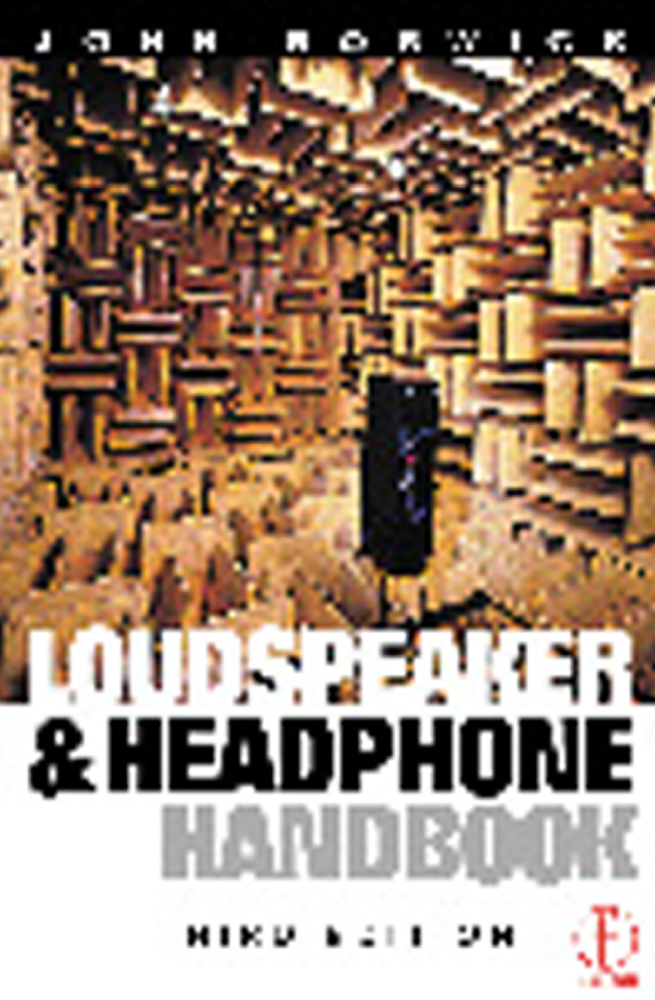

In [72]:
display_png(Image('./pics/handbook.png'))

## オーディオの科学
### スピーカの物理学
#### 過渡特性とインピーダンス
　　　　https://www.ne.jp/asahi/shiga/home/MyRoom/9416transient_impedance.pdf
#### 音響インピーダンスと放射インピーダンス
　　　　https://www.ne.jp/asahi/shiga/home/MyRoom/9522soundimpedance.pdf
#### ダイナミックスピーカの諸特性
　　　　https://www.ne.jp/asahi/shiga/home/MyRoom/9722dynamicspeaker.pdf
#### エンクロージャ
　　　　https://www.ne.jp/asahi/shiga/home/MyRoom/9903enclosurev2.pdf
#### スピーカシステムとその評価法
　　　　https://www.ne.jp/asahi/shiga/home/MyRoom/5706system.pdf


# FE83NV

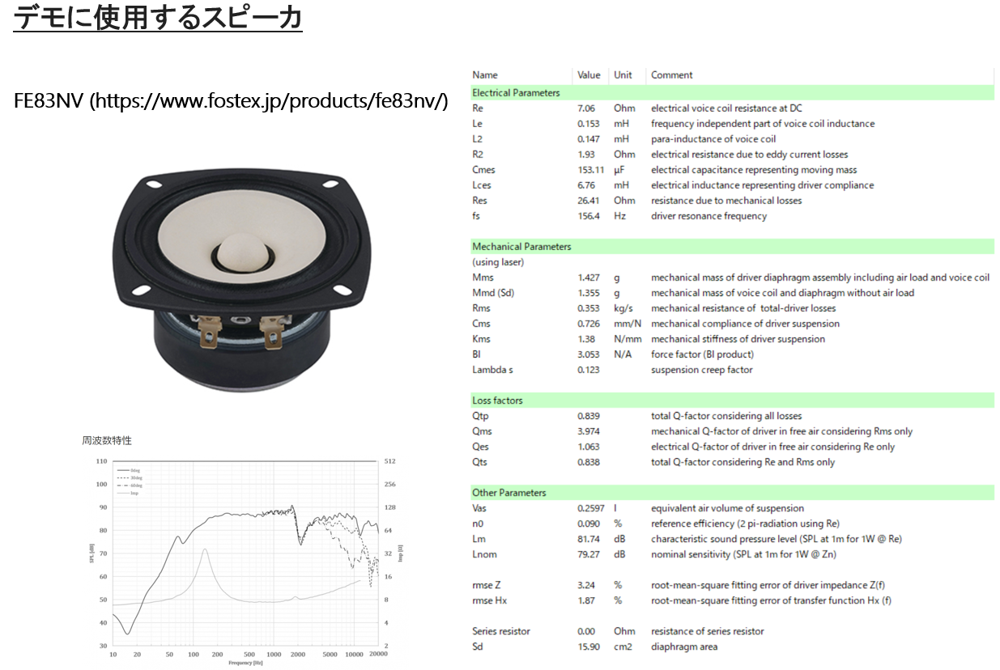

In [88]:
display_png(Image('./pics/FE83NV3.png'))

<!-- <img src='./pics/FE83NV3.png' height=350> -->

## Actual Data

In [108]:
# folder_name = "etani_csv"
folder_name = f"./etani_csv"
file_list = glob.glob("./" + folder_name + "/" + "FE83*.csv")
print(f"There are {int(len(file_list))} csv files")


There are 3 csv files


In [109]:
spl_df = pd.DataFrame()
imp_df = pd.DataFrame()
hd2_df = pd.DataFrame()
hd3_df = pd.DataFrame()
thd_df = pd.DataFrame()
time_stamps = []

for file in file_list : 
    name = file.split(".")[-2]
    serial_num = name.split("\\")[-1]

    data = pd.read_csv(file, skiprows=4)

    p0 = 10 ** (data[" SPL"] / 20) 
    h2 = 10 ** (data[" 2nd"] / 20)
    h3 = 10 ** (data[" 3rd"] / 20)
    td = np.sqrt(h2**2 + h3**2)
    thd = td / p0 * 100

    spl_df[serial_num] = data[" SPL"].copy()
    imp_df[serial_num] = data[" Imp"].copy()
    hd2_df[serial_num] = data[" 2nd"].copy()
    hd3_df[serial_num] = data[" 3rd"].copy()
    thd_df[serial_num] = thd.copy()
    
freq = data["FREQ "]

## Plot SPL/IMP

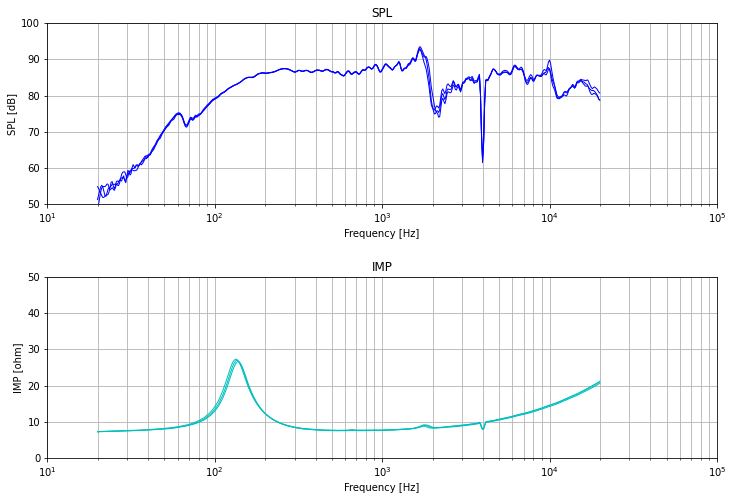

In [110]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df.keys()) : 
    ax[0].semilogx(freq, spl_df[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df[key], linewidth=1, color="c")

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    
plt.show()

# DEMO00 スピーカの電気回路とその解析例

## LTspice Result

In [7]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_00/demo_00.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)

    # dictにData Frameを格納
    result_dict[i] = result_df 

print("Finished!")

case count : 1
Finished!


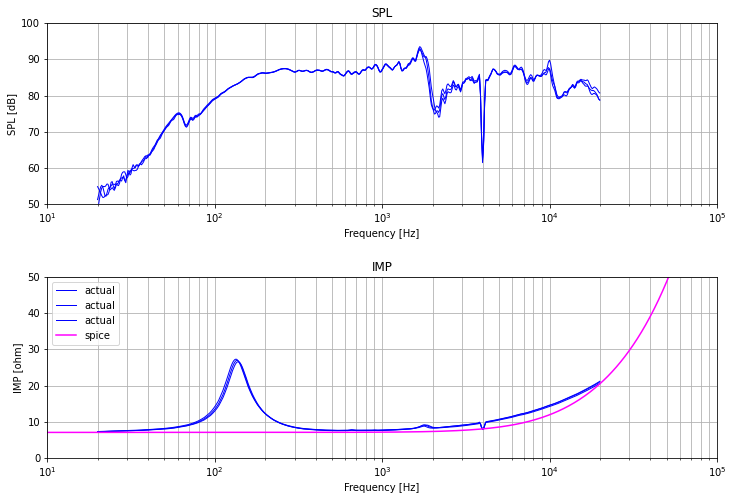

In [8]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df.keys()) : 
    ax[0].semilogx(freq, spl_df[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df[key], linewidth=1, color="b", label="actual")

ax[1].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["impedance[ohm]"], color="magenta", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

## Screenshot

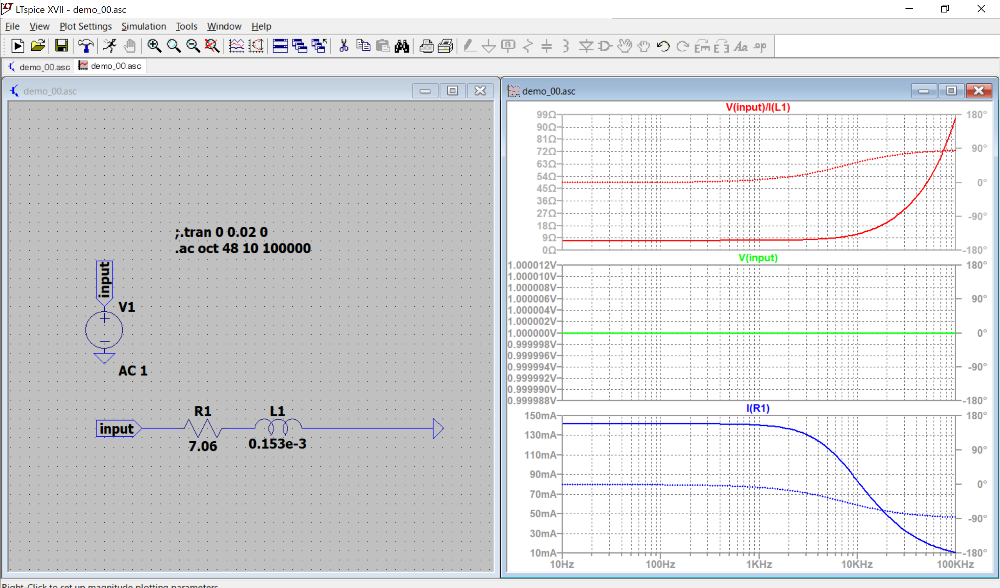

In [9]:
display_png(Image('./pics/demo_00_result.png'))

<!-- <img src='./pics/demo_00_result.png' height=350> -->

# DEMO01 スピーカの機械回路とその解析例

## LTspice Result

## Screenshot

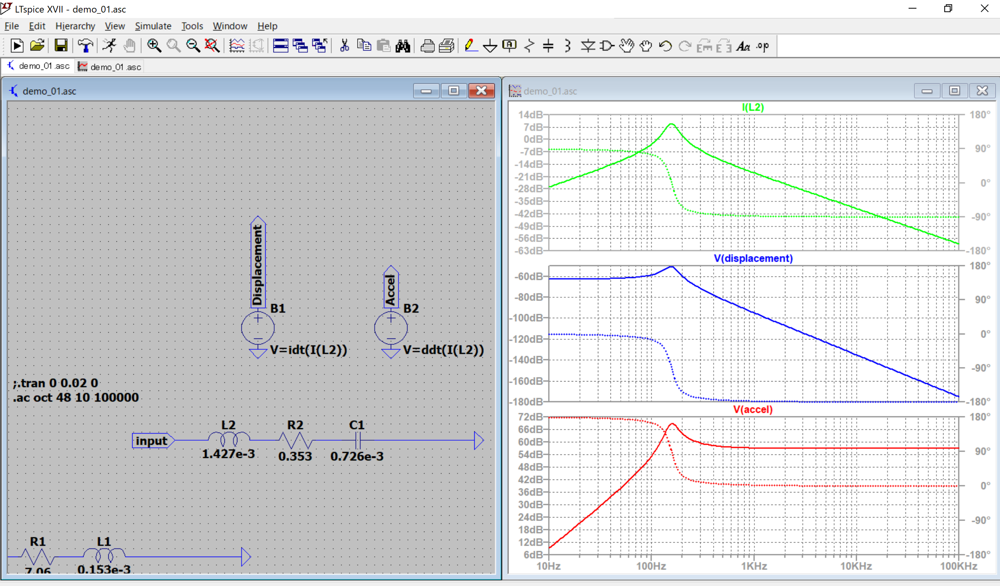

In [10]:
display_png(Image('./pics/demo_01_result.png'))

<!-- <img src='./pics/demo_01_result.png' height=350> -->

# DEMO02 電気回路と機械回路の連成

## LTspice Result

In [11]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_02/demo_02.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)

    # dictにData Frameを格納
    result_dict[i] = result_df 

print("Finished!")

case count : 1
Finished!


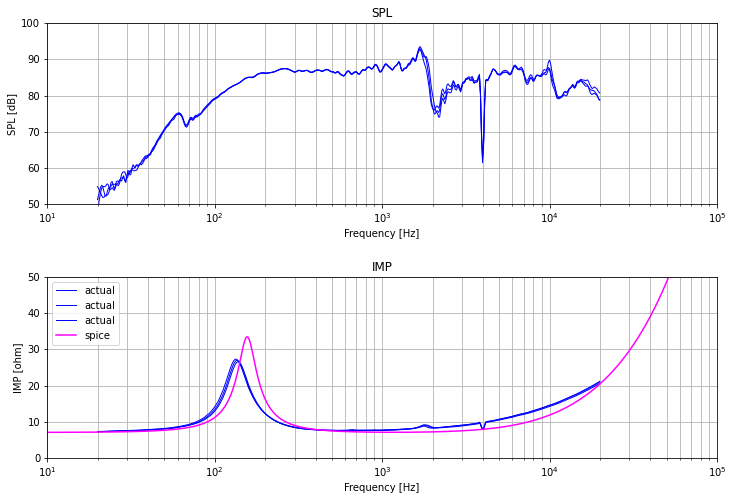

In [12]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df.keys()) : 
    ax[0].semilogx(freq, spl_df[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df[key], linewidth=1, color="b", label="actual")

ax[1].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["impedance[ohm]"], color="magenta", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

## Screenshot

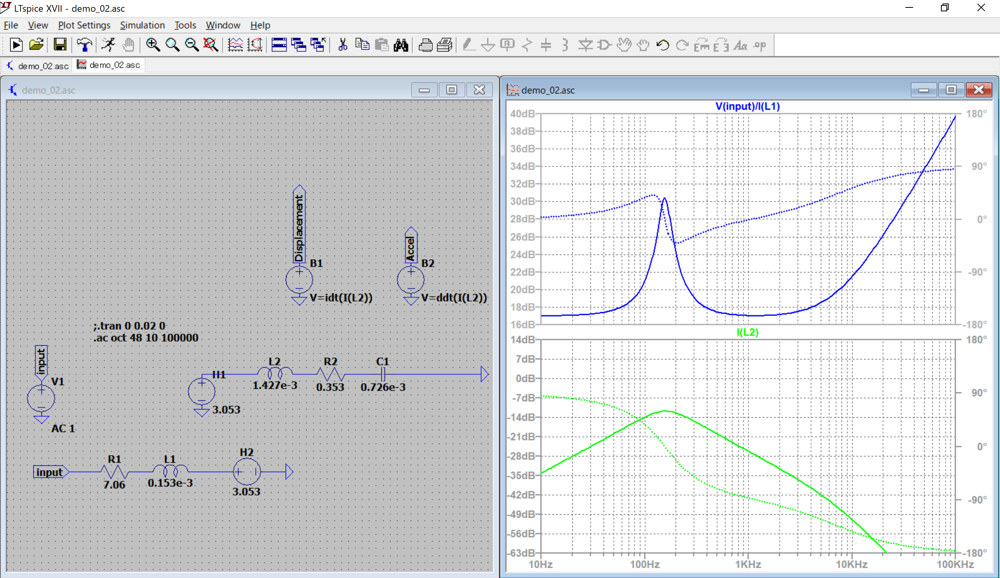

In [13]:
display_png(Image('./pics/demo_02_result.png'))

<!-- <img src='./pics/demo_02_result.png' height=350> -->

# DEMO03 パラメータの書き換え

## LTspice Result

## Screenshot

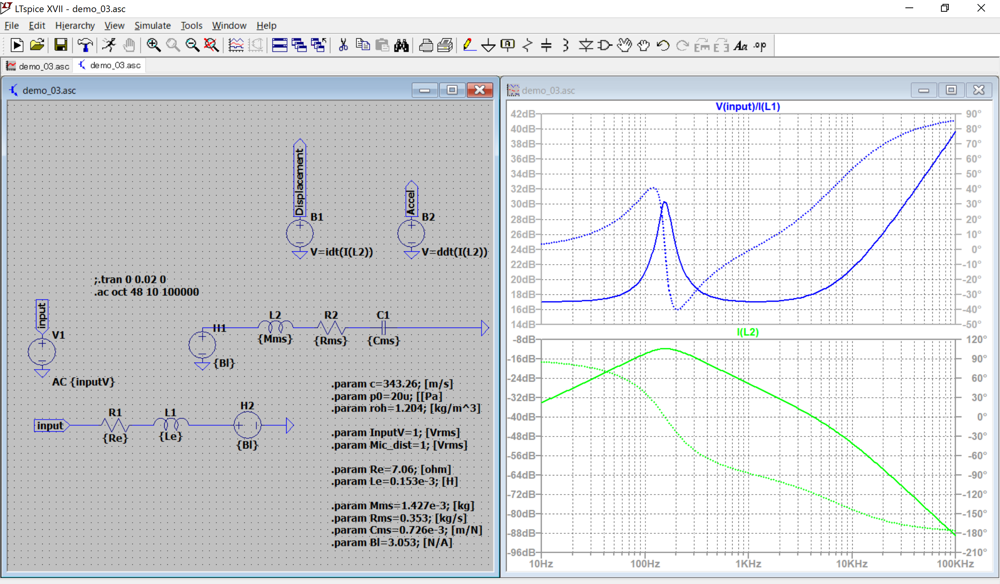

In [14]:
display_png(Image('./pics/demo_03_result.png'))

<!-- <img src='./pics/demo_03_result.png' height=350> -->

# DEMO04 振動板速度から音圧への計算

<!-- <img src='./pics/pressure.png' height=350> -->

駆動力$\tilde{F}$, 機械インピーダンス$\tilde{Z}_m$を用いると  
音圧強度$\tilde{p}$は、
$$
\Large
|\tilde{p}|=\frac{\omega \rho a^2}{2z_0}\left|\frac{\tilde{F}}{\tilde{Z}_m}\right|
$$
$\omega$ : 角周波数  
$\rho$ : 空気の密度  
$a$ : 有効振動半径  
$z_0$ : 距離  


## LTspice Result

In [15]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_04/demo_04.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict[i] = result_df 

print("Finished!")

case count : 1
Finished!


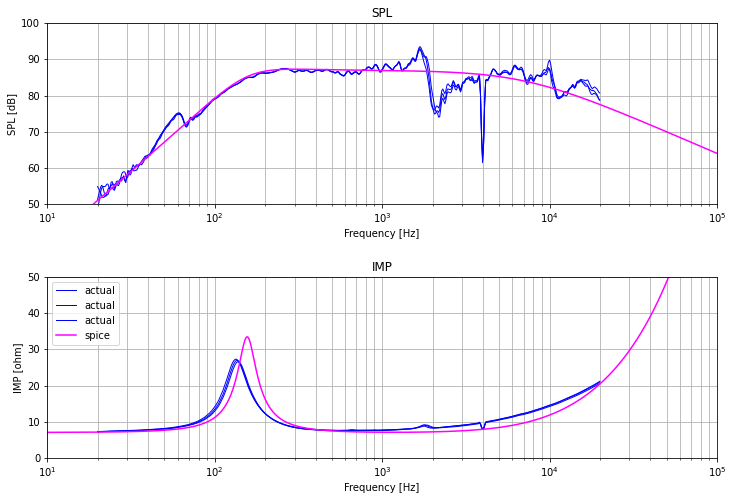

In [16]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df.keys()) : 
    ax[0].semilogx(freq, spl_df[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df[key], linewidth=1, color="b", label="actual")

ax[0].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["SPL[dB]"], color="magenta", label="spice")
ax[1].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["impedance[ohm]"], color="magenta", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

## Screenshot

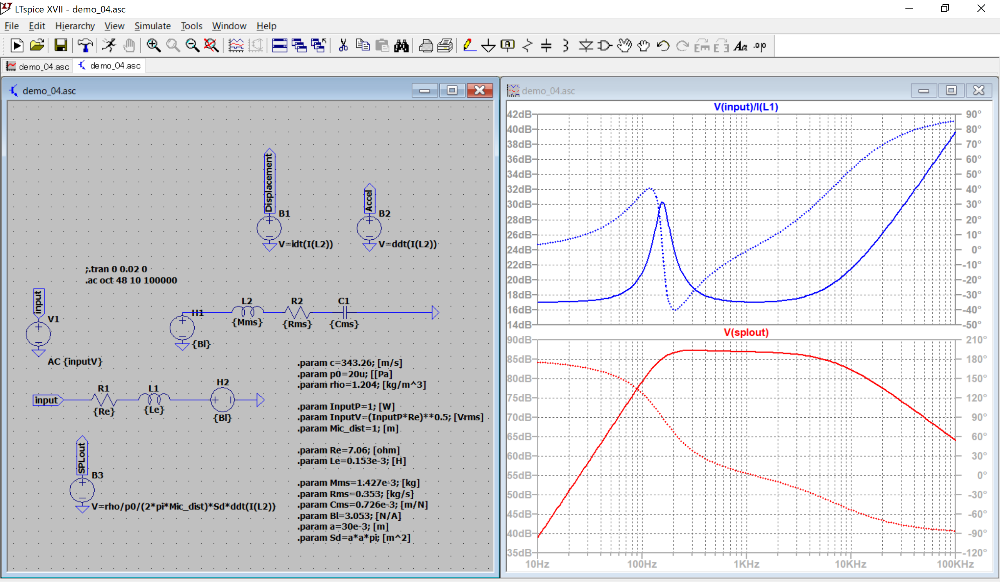

In [17]:
display_png(Image('./pics/demo_04_result.png'))

<!-- <img src='./pics/demo_04_result.png' height=350> -->

# DEMO05 音響回路の連成とその結果例

<img src='./pics/FE83NV_with_Box.png' height=350>

## Loudspeaker and Headphone Handbook より

<img src='./pics/acoustic_impedance.png' height=350>

## LTspice Result

In [18]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_05/demo_05.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_withbox = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_withbox[i] = result_df 

print("Finished!")

case count : 1
Finished!


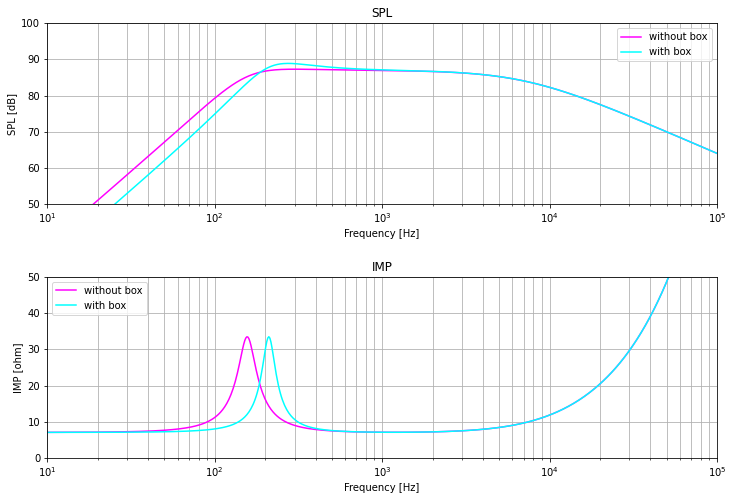

In [19]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax[0].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["SPL[dB]"], color="magenta", label="without box")
ax[1].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["impedance[ohm]"], color="magenta", label="without box")

ax[0].semilogx(result_dict_withbox[0]["Frequency[Hz]"], result_dict_withbox[0]["SPL[dB]"], color="cyan", label="with box")
ax[1].semilogx(result_dict_withbox[0]["Frequency[Hz]"], result_dict_withbox[0]["impedance[ohm]"], color="cyan", label="with box")
   

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    ax[i].legend()
plt.show()

## Screenshot

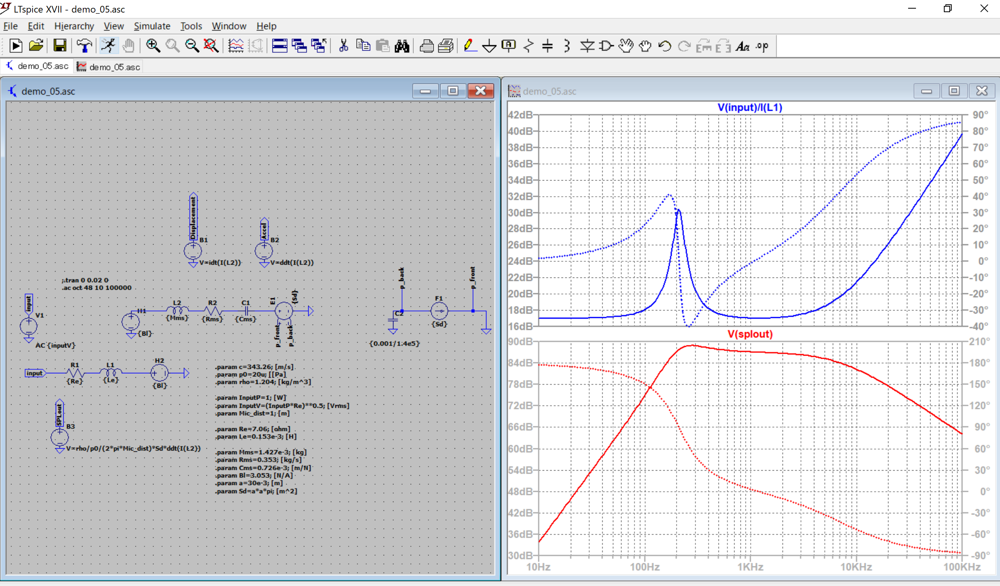

In [20]:
display_png(Image('./pics/demo_05_result.png'))

<!-- <img src='./pics/demo_05_result.png' height=350> -->

# DEMO06 サブサーキットの導入

## Loudspeaker and Headphone Handbook より

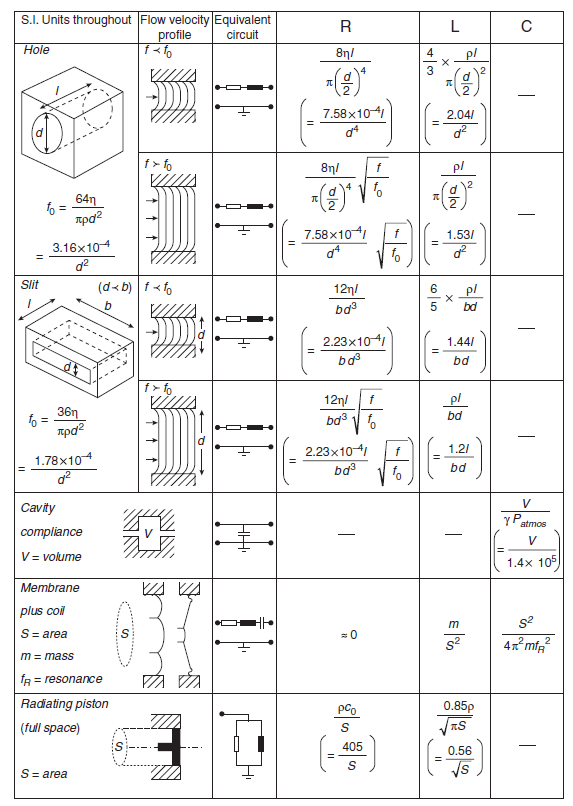

In [21]:
display_png(Image('./pics/acoustic_impedance.png'))

<!-- <img src='./pics/acoustic_impedance.png' height=350> -->

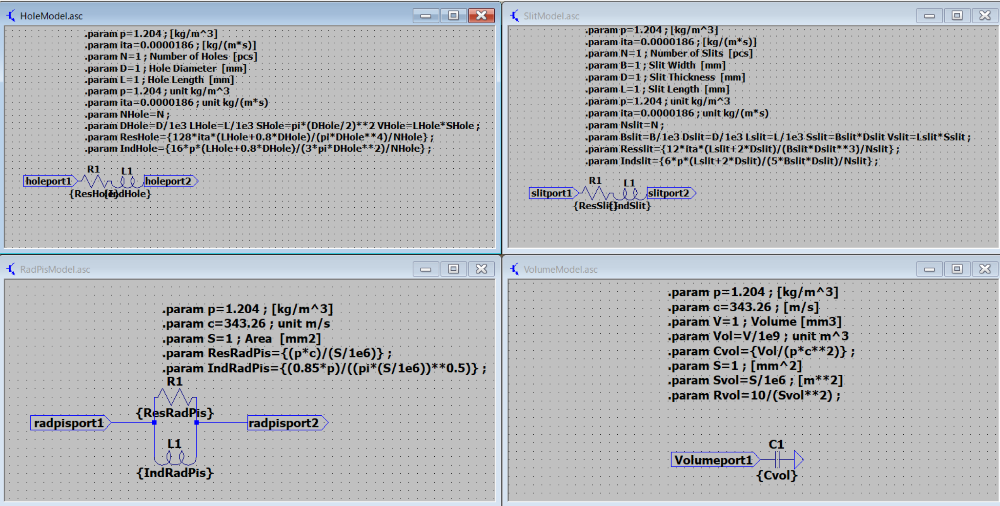

In [22]:
display_png(Image('./pics/subcircuit.png'))

<!-- <img src='./pics/subcircuit.png' height=350> -->

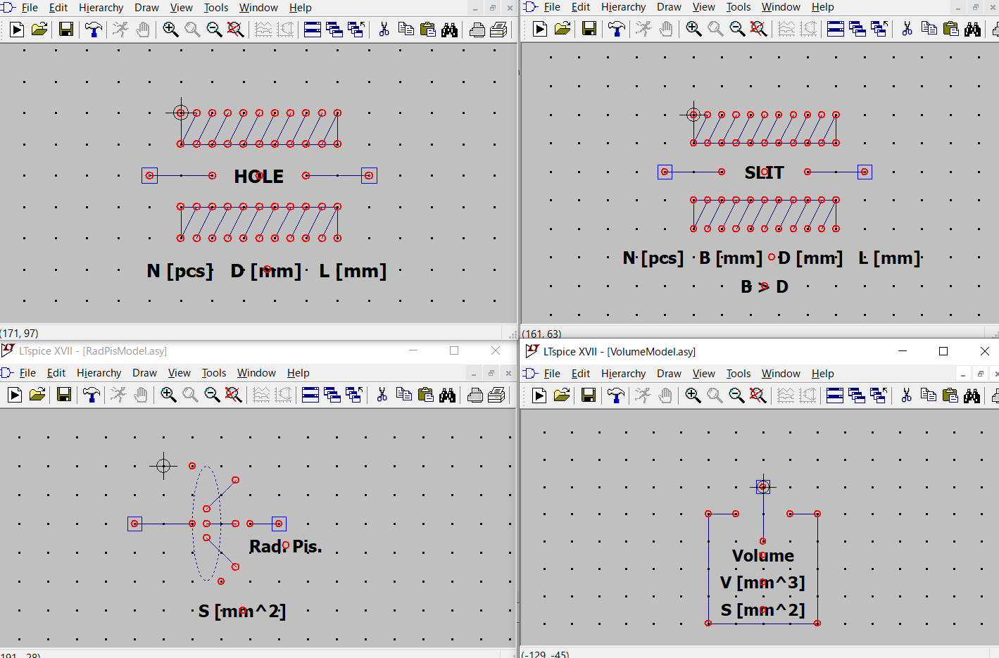

In [23]:
display_png(Image('./pics/asy.png'))

<!-- <img src='./pics/asy.png' height=350> -->

## LTspice Result

In [24]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_06/demo_06.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_withbox2 = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_withbox2[i] = result_df 

print("Finished!")

case count : 1
Finished!


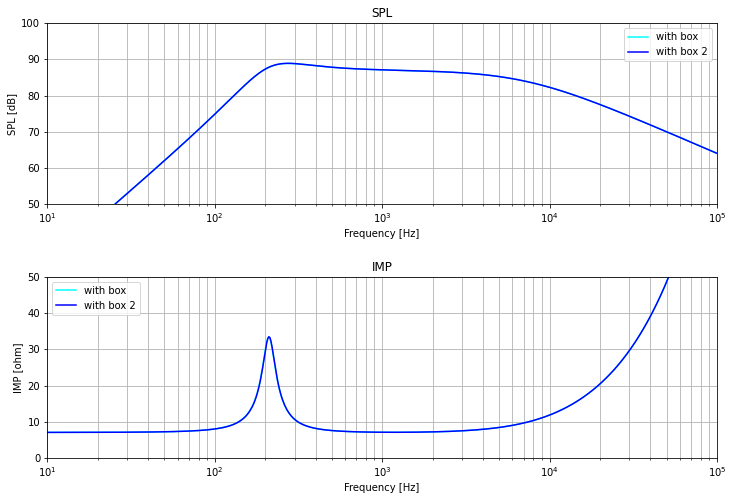

In [25]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# ax[0].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["SPL[dB]"], color="magenta", label="without box")
# ax[1].semilogx(result_dict[0]["Frequency[Hz]"], result_dict[0]["impedance[ohm]"], color="magenta", label="without box")

ax[0].semilogx(result_dict_withbox[0]["Frequency[Hz]"], result_dict_withbox[0]["SPL[dB]"], color="cyan", label="with box")
ax[1].semilogx(result_dict_withbox[0]["Frequency[Hz]"], result_dict_withbox[0]["impedance[ohm]"], color="cyan", label="with box")

ax[0].semilogx(result_dict_withbox2[0]["Frequency[Hz]"], result_dict_withbox2[0]["SPL[dB]"], color="b", label="with box 2")
ax[1].semilogx(result_dict_withbox2[0]["Frequency[Hz]"], result_dict_withbox2[0]["impedance[ohm]"], color="b", label="with box 2")


title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    ax[i].legend()
plt.show()

## Screenshot

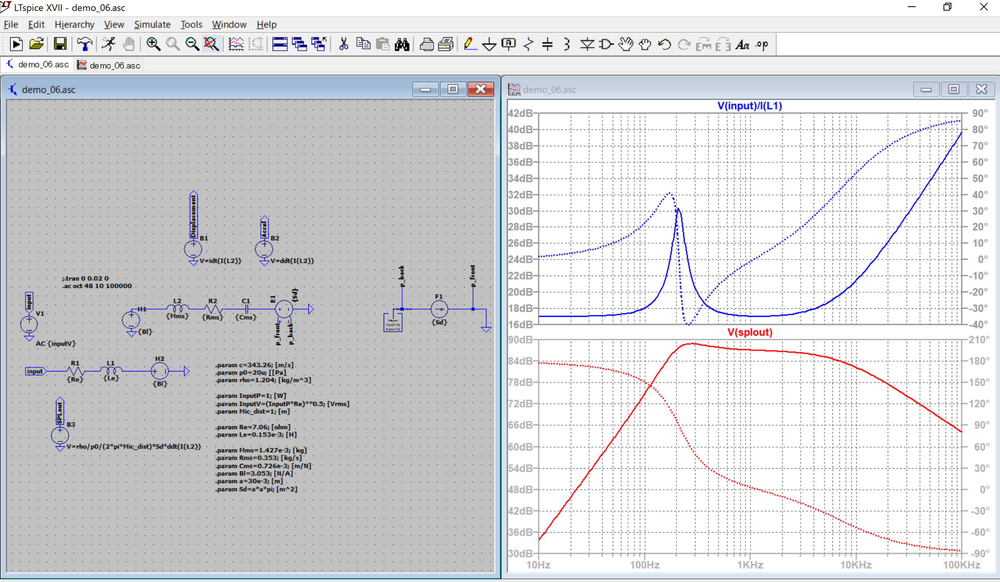

In [26]:
display_png(Image('./pics/demo_06_result.png'))

<!-- <img src='./pics/demo_06_result.png' height=350> -->

# DEMO07 パラメータの変更検討

## LTspice Result

In [27]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_07/demo_07.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_withbox = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_withbox[i] = result_df 

print("Finished!")

case count : 3
Finished!


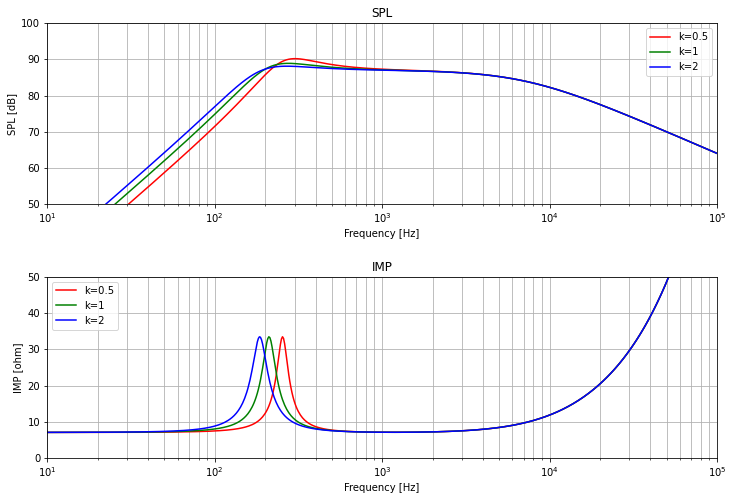

In [28]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

clr_list = ["r", "g", "b"]
val_list = [0.5, 1, 2]

for i, key in enumerate(result_dict_withbox.keys()) : 
    ax[0].semilogx(result_dict_withbox[i]["Frequency[Hz]"], result_dict_withbox[i]["SPL[dB]"], color=clr_list[i], label=f"k={val_list[i]}")
    ax[1].semilogx(result_dict_withbox[i]["Frequency[Hz]"], result_dict_withbox[i]["impedance[ohm]"],  color=clr_list[i], label=f"k={val_list[i]}")

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    ax[i].legend()
plt.show()

## Screenshot

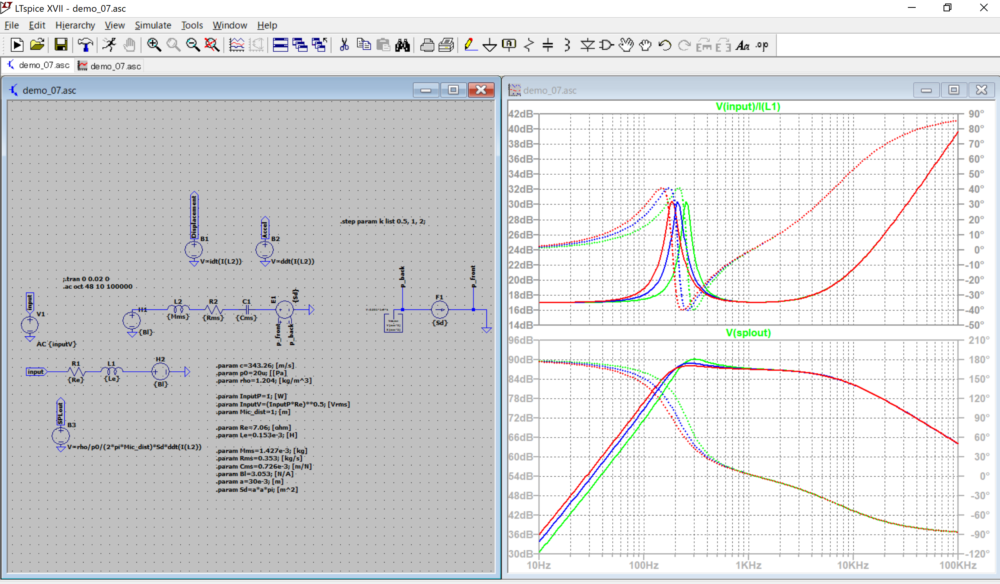

In [29]:
display_png(Image('./pics/demo_07_result.png'))

<!-- <img src='./pics/demo_07_result.png' height=350> -->

# DEMO08 より複雑な回路

## 35dia MAT-H

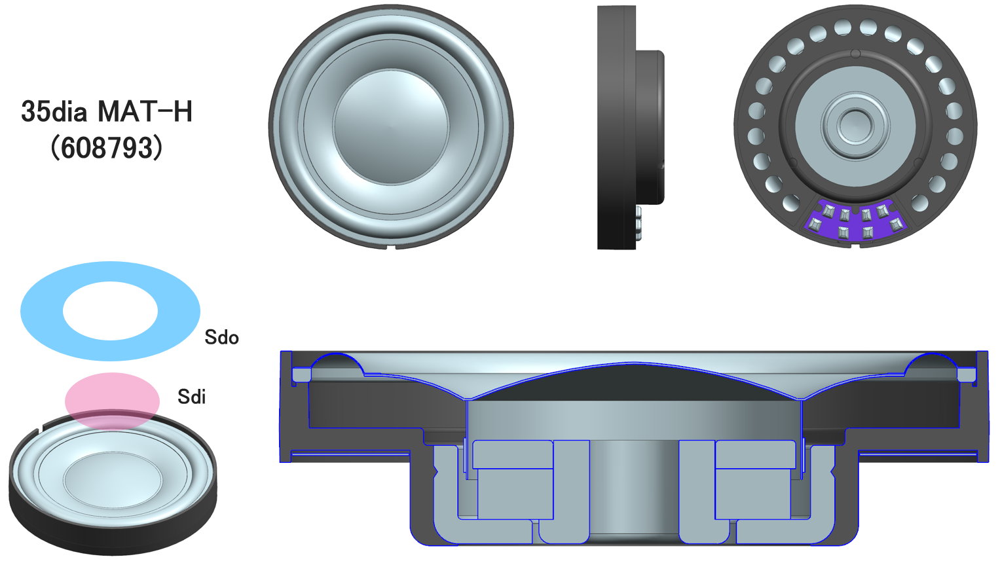

In [118]:
display_png(Image('./pics/sidewall.png'))

In [119]:
# folder_name = "etani_csv"
folder_name = f"./etani_csv"
file_list = glob.glob("./" + folder_name + "/" + "35dia*.csv")
print(f"There are {int(len(file_list))} csv files")


There are 3 csv files


In [120]:
spl_df_35dia = pd.DataFrame()
imp_df_35dia = pd.DataFrame()
hd2_df_35dia = pd.DataFrame()
hd3_df_35dia = pd.DataFrame()
thd_df_35dia = pd.DataFrame()
time_stamps = []

for file in file_list : 
    name = file.split(".")[-2]
    serial_num = name.split("\\")[-1]

    data = pd.read_csv(file, skiprows=4)

    p0 = 10 ** (data[" SPL"] / 20) 
    h2 = 10 ** (data[" 2nd"] / 20)
    h3 = 10 ** (data[" 3rd"] / 20)
    td = np.sqrt(h2**2 + h3**2)
    thd = td / p0 * 100

    spl_df_35dia[serial_num] = data[" SPL"].copy()
    imp_df_35dia[serial_num] = data[" Imp"].copy()
    hd2_df_35dia[serial_num] = data[" 2nd"].copy()
    hd3_df_35dia[serial_num] = data[" 3rd"].copy()
    thd_df_35dia[serial_num] = thd.copy()
    
freq = data["FREQ "]

## Plot SPL/IMP

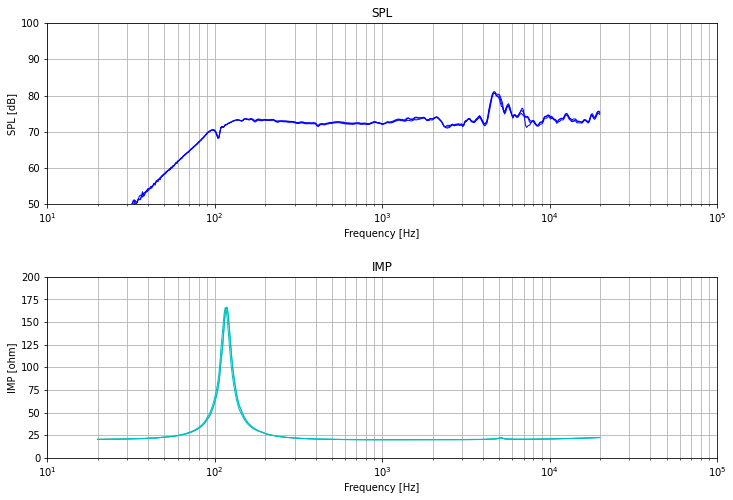

In [121]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df_35dia.keys()) : 
    ax[0].semilogx(freq, spl_df_35dia[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df_35dia[key], linewidth=1, color="c")

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 200)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    
plt.show()

## LTspice Result

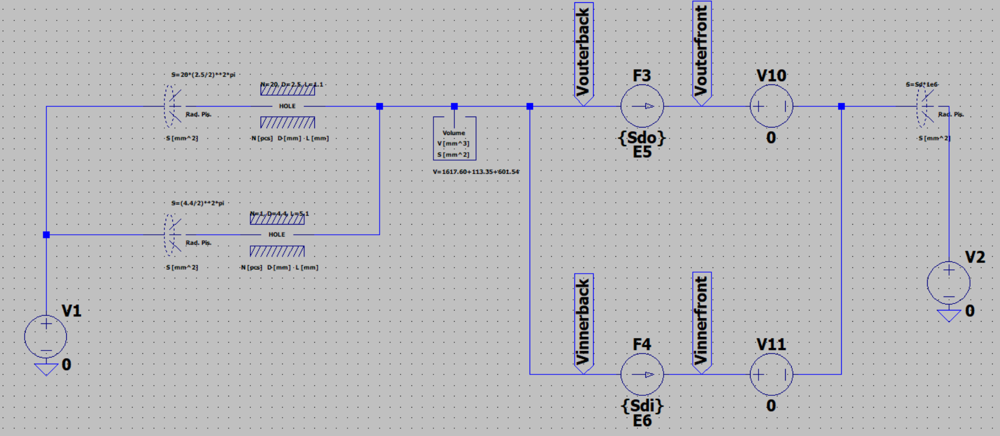

In [122]:
display_png(Image('./pics/demo_08_1.png'))

In [123]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_08/demo_08_1.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_81 = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(spl_aco)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_81[i] = result_df 

print("Finished!")

case count : 1
Finished!


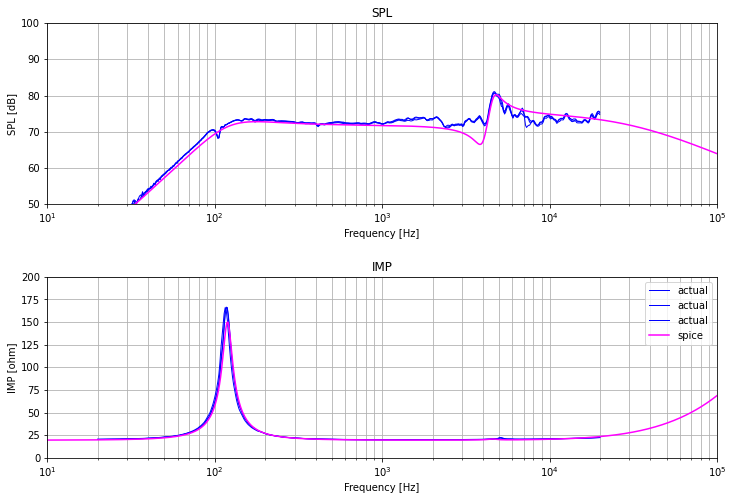

In [124]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df_35dia.keys()) : 
    ax[0].semilogx(freq, spl_df_35dia[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df_35dia[key], linewidth=1, color="b", label="actual")

ax[0].semilogx(result_dict_81[0]["Frequency[Hz]"], result_dict_81[0]["SPL[dB]"], color="magenta", label="spice")
ax[1].semilogx(result_dict_81[0]["Frequency[Hz]"], result_dict_81[0]["impedance[ohm]"], color="magenta", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 200)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

## LTspice Result

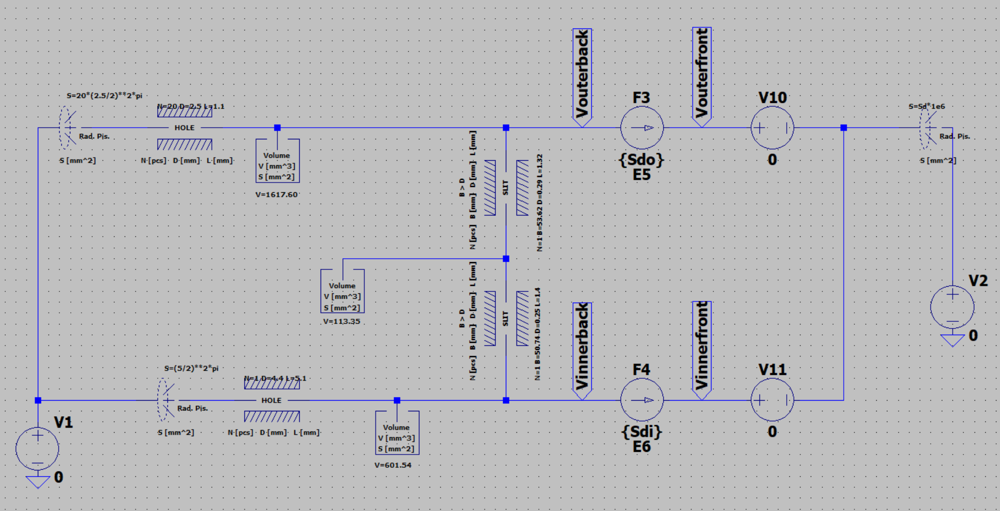

In [125]:
display_png(Image('./pics/demo_08_2.png'))

In [126]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_08/demo_08_2.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_82 = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(spl_aco)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_82[i] = result_df 

print("Finished!")

case count : 1
Finished!


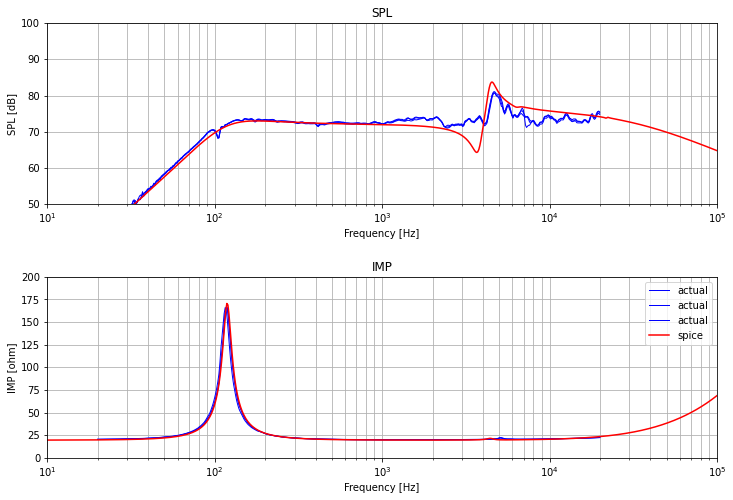

In [127]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(spl_df_35dia.keys()) : 
    ax[0].semilogx(freq, spl_df_35dia[key], linewidth=1, color="b")
    ax[1].semilogx(freq, imp_df_35dia[key], linewidth=1, color="b", label="actual")

ax[0].semilogx(result_dict_82[0]["Frequency[Hz]"], result_dict_82[0]["SPL[dB]"], color="r", label="spice")
ax[1].semilogx(result_dict_82[0]["Frequency[Hz]"], result_dict_82[0]["impedance[ohm]"], color="r", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 200)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

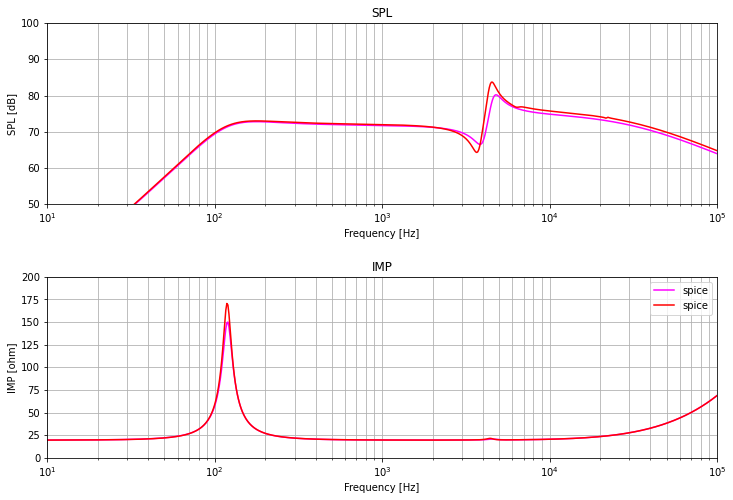

In [128]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# for key in list(spl_df_35dia.keys()) : 
#     ax[0].semilogx(freq, spl_df_35dia[key], linewidth=1, color="b")
#     ax[1].semilogx(freq, imp_df_35dia[key], linewidth=1, color="b", label="actual")

ax[0].semilogx(result_dict_81[0]["Frequency[Hz]"], result_dict_81[0]["SPL[dB]"], color="magenta", label="spice")
ax[1].semilogx(result_dict_81[0]["Frequency[Hz]"], result_dict_81[0]["impedance[ohm]"], color="magenta", label="spice")

ax[0].semilogx(result_dict_82[0]["Frequency[Hz]"], result_dict_82[0]["SPL[dB]"], color="r", label="spice")
ax[1].semilogx(result_dict_82[0]["Frequency[Hz]"], result_dict_82[0]["impedance[ohm]"], color="r", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 200)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

# DEMO09 圧力音場での解析例

## 35dia MAT-H with Coupler Adaptor

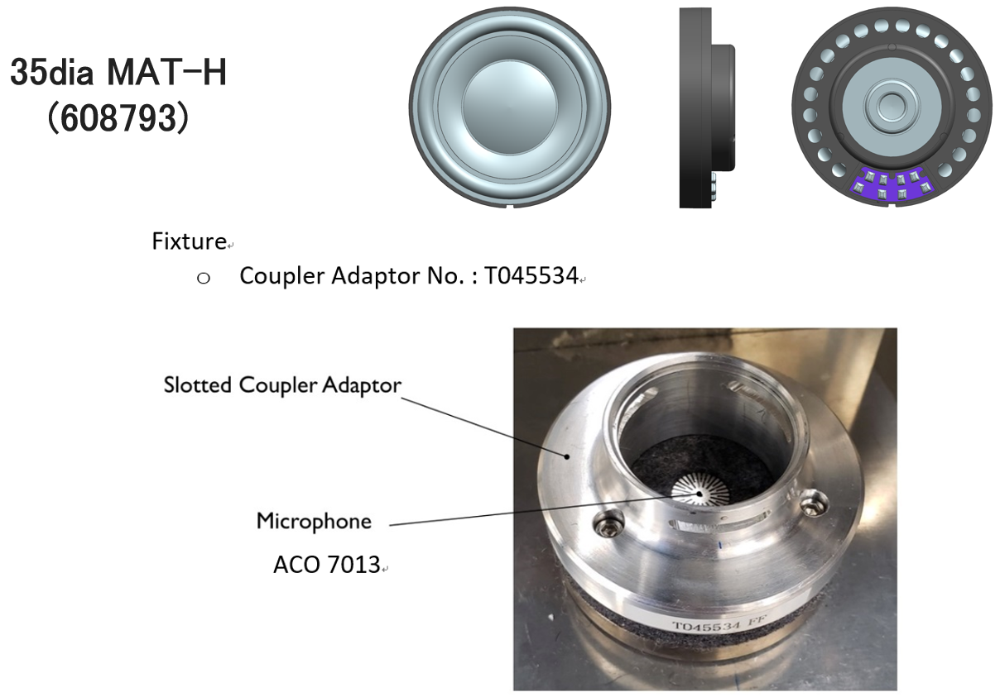

In [129]:
display_png(Image('./pics/sidewall_with_adaptor.png'))

In [130]:
file_path = "./etani_csv/sidewall_s255_"
sample_list = ["sample01_30s", "sample02_30s", "sample03_30s", "sample04_30s", "sample05_30s", "sample01_03s", "sample02_03s", "sample03_03s", "sample04_03s", "sample05_03s"]

etani_spl_file = file_path + "SPL.csv"
etani_imp_file = file_path + "IMP.csv"

etani_spl_data = pd.read_csv(etani_spl_file, skiprows=10)
etani_spl_freq_df = etani_spl_data.iloc[:, 0]
etani_spl_data_df = etani_spl_data.iloc[:, 1:]
etani_spl_data_df = etani_spl_data.iloc[:, 1:]
etani_spl_data_df.columns = sample_list

etani_imp_data = pd.read_csv(etani_imp_file, skiprows=10)
etani_imp_freq_df = etani_imp_data.iloc[:, 0]
etani_imp_data_df = etani_imp_data.iloc[:, 1:]
etani_imp_data_df = etani_imp_data.iloc[:, 1:]
etani_imp_data_df.columns = sample_list


## LTspice Result

In [131]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_09/demo_09.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_9 = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(spl_pf)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2/0.00002))

    # dictにData Frameを格納
    result_dict_9[i] = result_df 

print("Finished!")

case count : 1
Finished!


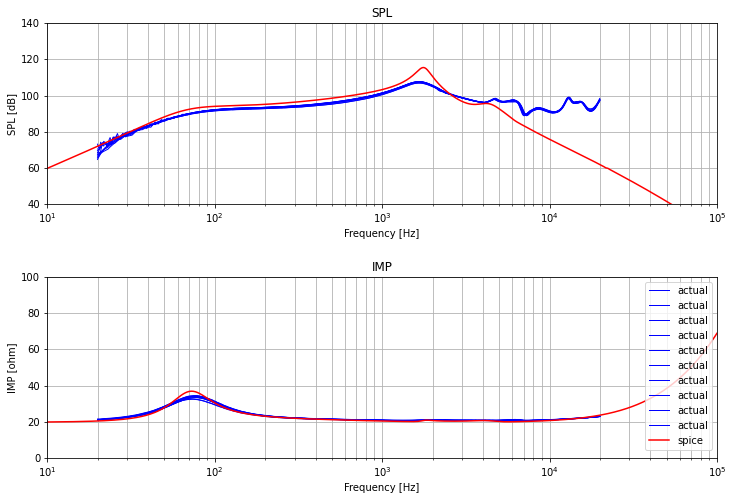

In [132]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for key in list(etani_spl_data_df.keys()) : 
    ax[0].semilogx(etani_spl_freq_df, etani_spl_data_df[key], linewidth=1, color="b")
    ax[1].semilogx(freq, etani_imp_data_df[key], linewidth=1, color="b", label="actual")

ax[0].semilogx(result_dict_9[0]["Frequency[Hz]"], result_dict_9[0]["SPL[dB]"], color="r", label="spice")
ax[1].semilogx(result_dict_9[0]["Frequency[Hz]"], result_dict_9[0]["impedance[ohm]"], color="r", label="spice")
    
title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(40, 140), (0, 100)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

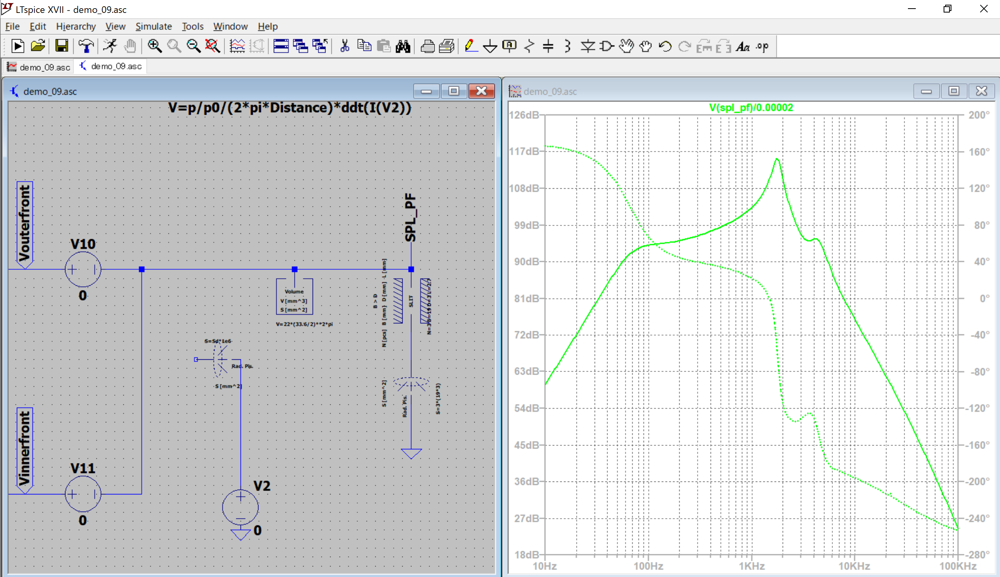

In [133]:
display_png(Image('./pics/demo_09_result.png'))

# DEMO10 ばらつきの検討例

## gauss

***gauss(x)***

*Random number from Gaussian distribution with sigma of x.

### LTspice Result

In [134]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_10/demo_10_1.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_gauss = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    V3 = l.get_data('V(varm)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))
    result_df["var_m"] = V3

    # dictにData Frameを格納
    result_dict_gauss[i] = result_df 

print("Finished!")

case count : 200
Finished!


No handles with labels found to put in legend.


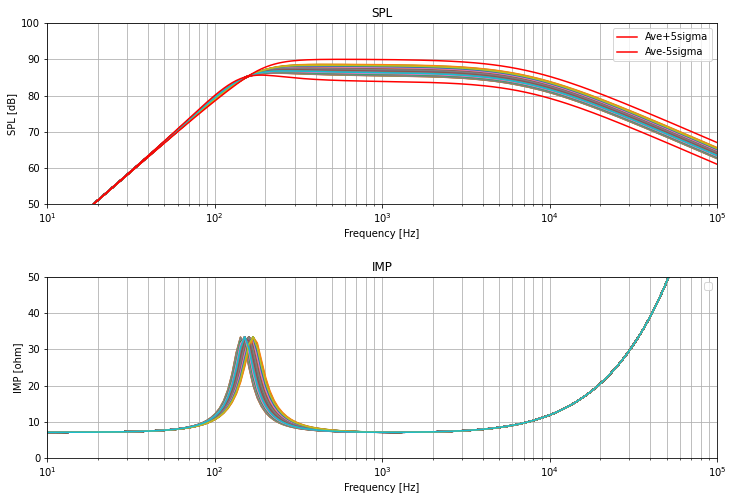

In [135]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# clr_list = ["r", "g", "b"]
# val_list = [0.5, 1, 2]

for i, key in enumerate(result_dict_gauss.keys()) : 
    ax[0].semilogx(result_dict_gauss[i]["Frequency[Hz]"], result_dict_gauss[i]["SPL[dB]"])
    ax[1].semilogx(result_dict_gauss[i]["Frequency[Hz]"], result_dict_gauss[i]["impedance[ohm]"])
    if i == 0 : 
        spl_df_tent = result_dict_gauss[i]["SPL[dB]"].copy()
    else : 
        spl_df_tent = pd.concat([spl_df_tent, result_dict_gauss[i]["SPL[dB]"].copy()], axis=1)

ave_sigma5_plus = spl_df_tent.mean(axis=1) + 5 * spl_df_tent.std(axis=1)
ave_sigma5_minus = spl_df_tent.mean(axis=1) - 5 * spl_df_tent.std(axis=1)
ax[0].semilogx(result_dict_gauss[0]["Frequency[Hz]"], ave_sigma5_plus, color="r", label="Ave+5sigma")     
ax[0].semilogx(result_dict_gauss[0]["Frequency[Hz]"], ave_sigma5_minus, color="r", label="Ave-5sigma")     

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    ax[i].legend()
plt.show()

C:\Users\FYST.FF\Anaconda3\lib\site-packages\matplotlib\collections.py:206: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)
C:\Users\FYST.FF\Anaconda3\lib\site-packages\numpy\lib\histograms.py:839: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
C:\Users\FYST.FF\Anaconda3\lib\site-packages\matplotlib\transforms.py:788: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


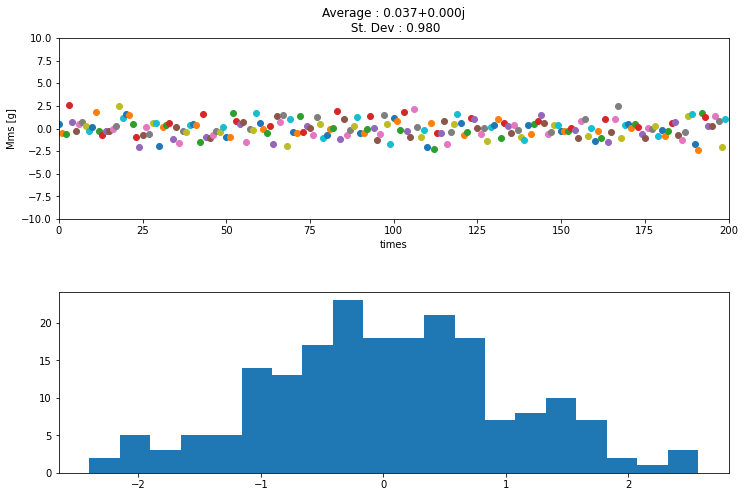

In [136]:
from scipy.stats import norm

fig, ax = plt.subplots(nrows=2, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# clr_list = ["r", "g", "b"]
# val_list = [0.5, 1, 2]

varm_list = []

for i in range(l.case_count) : 
    ax[0].scatter(i, result_dict_gauss[i]["var_m"][0])
    varm_list.append(result_dict_gauss[i]["var_m"][0])
ax[1].hist(varm_list, bins=20)

varm_array = np.array(varm_list)
ax[0].set_title(f"Average : {varm_array.mean():.3f}\n St. Dev : {varm_array.std():.3f}")
ax[0].set_xlim(0, l.case_count)
ax[0].set_xlabel("times")
ax[0].set_ylim(-10, 10)
ax[0].set_ylabel("Mms [g]")
# ax.grid(which="both")

plt.show()

### Screenshot

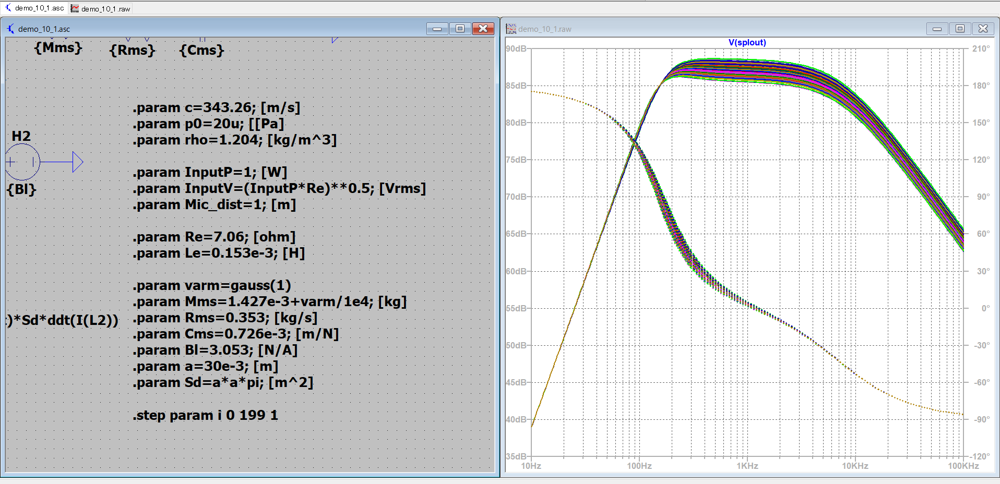

In [137]:
display_png(Image('./pics/demo_10_1_result.png'))

## Monte Carlo


***mc(x,y)***
 
*A random number between x*(1+y) and x*(1-y) with uniform distribution.

### LTspice Result

In [138]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_10/demo_10_2.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_mc = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R1)', i)              # 音圧の取得
    V2 = l.get_data('V(splout)', i)              # 音圧の取得
    V3 = l.get_data('V(varm)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))
    result_df["var_m"] = V3

    # dictにData Frameを格納
    result_dict_mc[i] = result_df 

print("Finished!")

case count : 200
Finished!


No handles with labels found to put in legend.


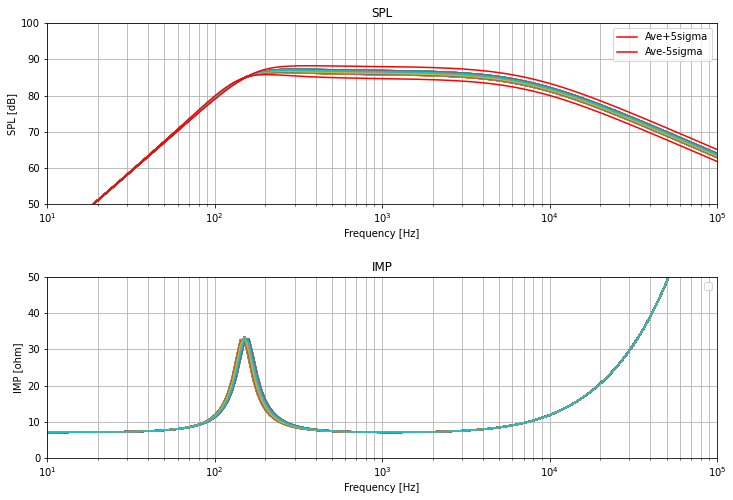

In [139]:
item_num = 2
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# clr_list = ["r", "g", "b"]
# val_list = [0.5, 1, 2]

for i, key in enumerate(result_dict_mc.keys()) : 
    ax[0].semilogx(result_dict_mc[i]["Frequency[Hz]"], result_dict_mc[i]["SPL[dB]"])
    ax[1].semilogx(result_dict_mc[i]["Frequency[Hz]"], result_dict_mc[i]["impedance[ohm]"])
    if i == 0 : 
        spl_df_tent = result_dict_mc[i]["SPL[dB]"].copy()
    else : 
        spl_df_tent = pd.concat([spl_df_tent, result_dict_mc[i]["SPL[dB]"].copy()], axis=1)

ave_plus_sigma5 = spl_df_tent.mean(axis=1) + 5 * spl_df_tent.std(axis=1)
ave_minus_sigma5 = spl_df_tent.mean(axis=1) - 5 * spl_df_tent.std(axis=1)
ax[0].semilogx(result_dict_mc[0]["Frequency[Hz]"], ave_plus_sigma5, color="r", label="Ave+5sigma")     
ax[0].semilogx(result_dict_mc[0]["Frequency[Hz]"], ave_minus_sigma5, color="r", label="Ave-5sigma")     

title_list = ["SPL", "IMP"]
ylabel_list = ["SPL [dB]", "IMP [ohm]"]
yrange_list = [(50, 100), (0, 50)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
    ax[i].legend()
plt.show()

C:\Users\FYST.FF\Anaconda3\lib\site-packages\matplotlib\collections.py:206: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)
C:\Users\FYST.FF\Anaconda3\lib\site-packages\numpy\lib\histograms.py:839: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
C:\Users\FYST.FF\Anaconda3\lib\site-packages\matplotlib\transforms.py:788: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


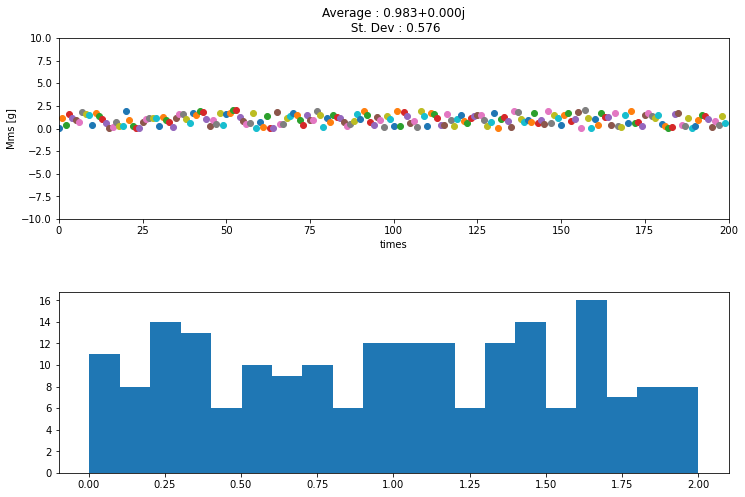

In [140]:
from scipy.stats import norm

fig, ax = plt.subplots(nrows=2, figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# clr_list = ["r", "g", "b"]
# val_list = [0.5, 1, 2]

varm_list = []

for i in range(l.case_count) : 
    ax[0].scatter(i, result_dict_mc[i]["var_m"][0])
    varm_list.append(result_dict_mc[i]["var_m"][0])
ax[1].hist(varm_list, bins=20)

varm_array = np.array(varm_list)
ax[0].set_title(f"Average : {varm_array.mean():.3f}\n St. Dev : {varm_array.std():.3f}")
ax[0].set_xlim(0, l.case_count)
ax[0].set_xlabel("times")
ax[0].set_ylim(-10, 10)
ax[0].set_ylabel("Mms [g]")
# ax.grid(which="both")

plt.show()

### Screenshot

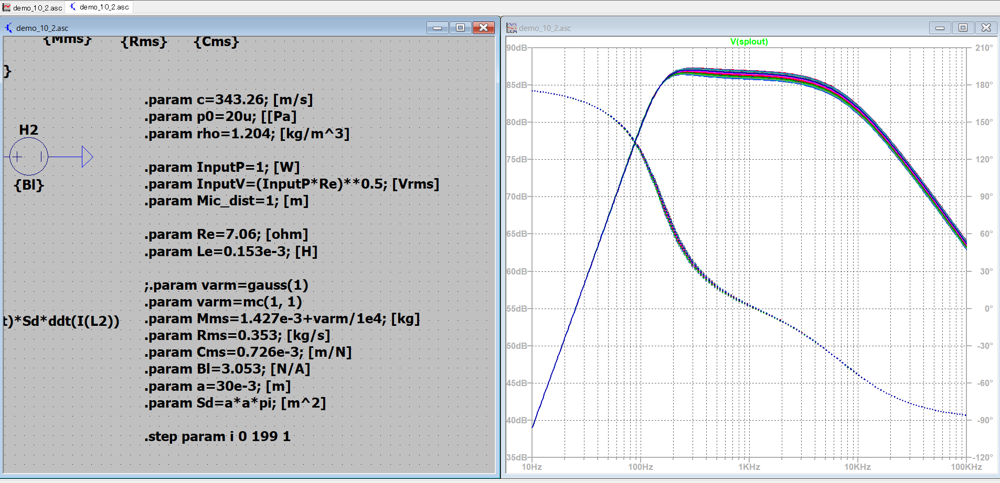

In [87]:
display_png(Image('./pics/demo_10_2_result.png'))

# DEMO11 非線形素子の利用

## .func & Behavioral Voltage Source

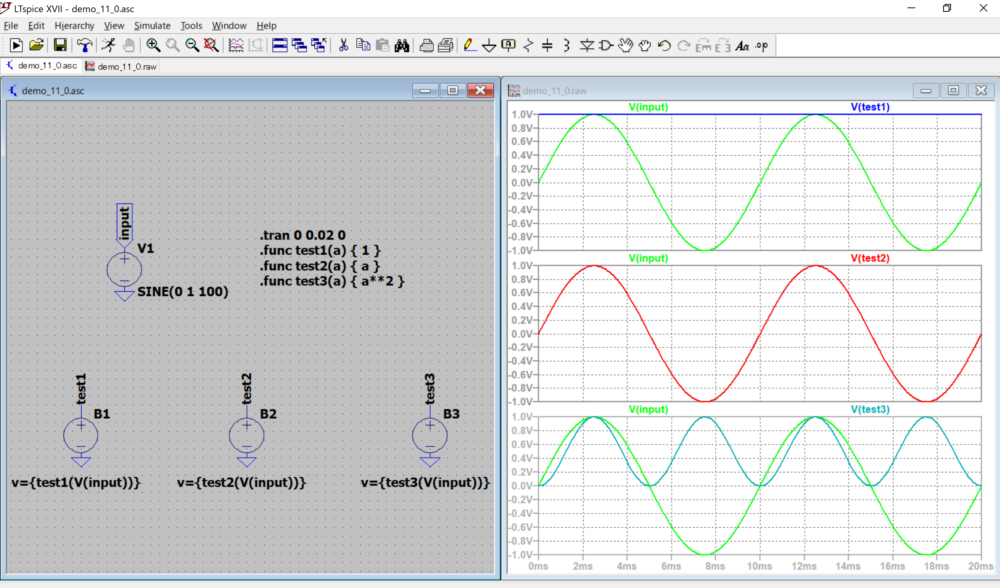

In [54]:
display_png(Image('./pics/demo_11_0_result.png'))

## LTspice Result

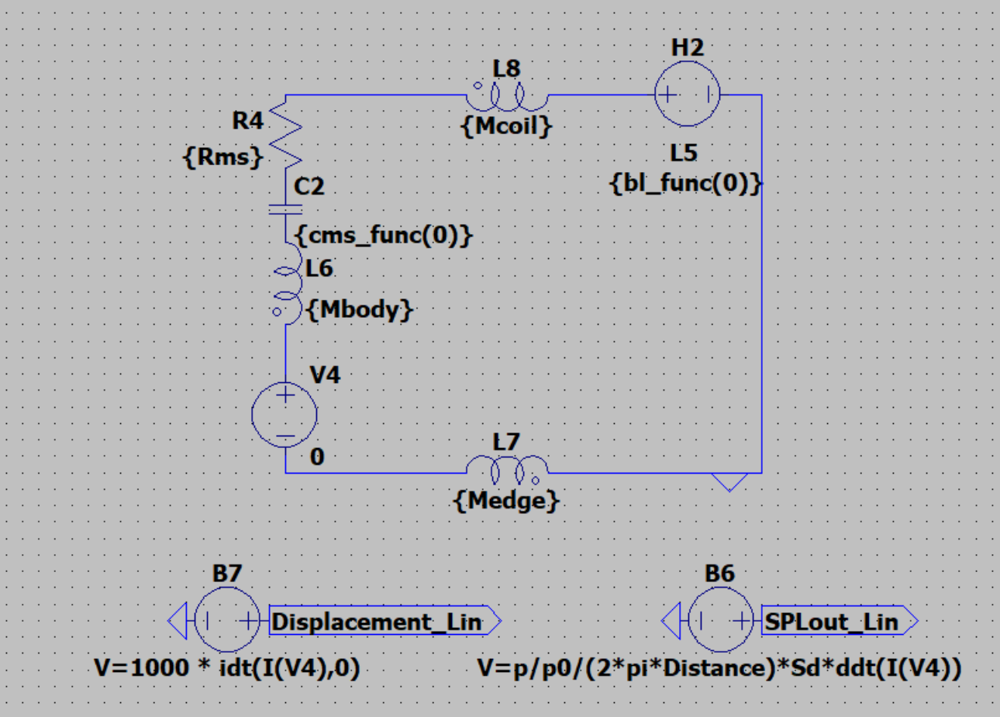

In [55]:
display_png(Image('./pics/demo_11_2_result.png'))

In [56]:
import subprocess
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import math

# LTspiceを起動してcirファイルを解析
# subprocess.call(["C:\Program Files\LTC\LTspiceXVII\XVIIx64.exe", "-b", f"{cir_file}"])

raw_file = "./spice_files/demo_11/demo_11_2.raw"

# 結果ファイルを読み込む
l = ltspice.Ltspice(raw_file)
l.parse()

# 結果まとめ用のdict
result_dict_11 = {}

print(f"case count : {l.case_count}")

# パラメータ振った場合
for i in range(l.case_count) : 

    # データ格納のためのData Frame
    result_df = pd.DataFrame()

    lt_freq = l.get_frequency()                      # 周波数の取得
    V0 = l.get_data('V(input)', i)        # 音圧の取得
    V1 = l.get_data('I(R3)', i)              # 音圧の取得
    V2 = l.get_data('V(splout_lin)', i)              # 音圧の取得
    V3 = l.get_data('V(displacement_lin)', i)              # 音圧の取得
    # V2 = l.get_data('I(L10)', i)              # 音圧の取得
    # V2 = V0 + V1
    
    # Data Frameに格納
    result_df["Frequency[Hz]"] = lt_freq
    result_df["input[V]"] = V0
    result_df["current[A]"] = V1
    result_df["impedance[ohm]"] = abs(V0/V1)
    result_df["displacement[mm]"] = abs(V3)
    result_df["SPL[dB]"] = 20 * np.log10(abs(V2))

    # dictにData Frameを格納
    result_dict_11[i] = result_df 

print("Finished!")

case count : 3
Finished!


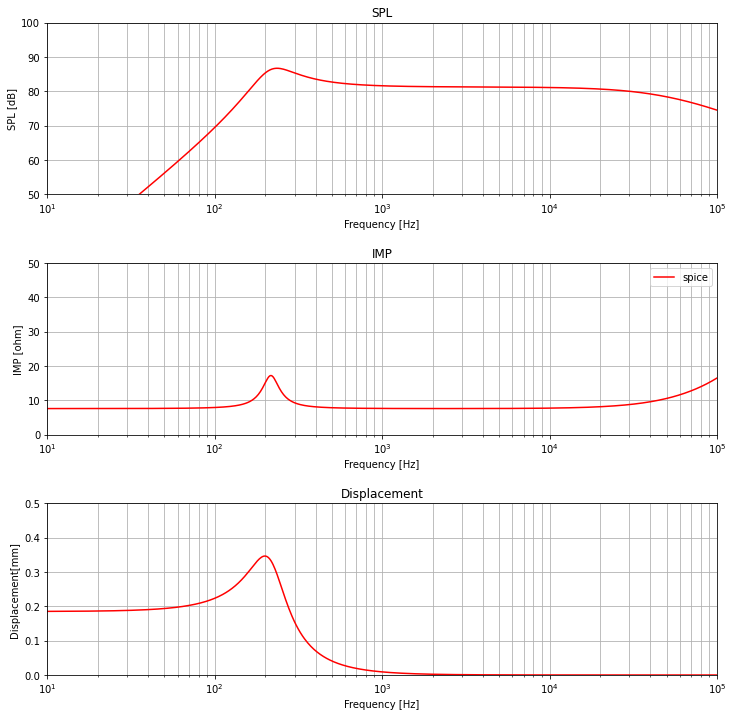

In [57]:
item_num = 3
fig, ax = plt.subplots(nrows=item_num, figsize=(12, 12))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax[0].semilogx(result_dict_11[0]["Frequency[Hz]"], result_dict_11[0]["SPL[dB]"], color="r", label="spice")
ax[1].semilogx(result_dict_11[0]["Frequency[Hz]"], result_dict_11[0]["impedance[ohm]"], color="r", label="spice")
ax[2].semilogx(result_dict_11[0]["Frequency[Hz]"], result_dict_11[0]["displacement[mm]"], color="r", label="spice")
    
title_list = ["SPL", "IMP", "Displacement"]
ylabel_list = ["SPL [dB]", "IMP [ohm]", "Displacement[mm]"]
yrange_list = [(50, 100), (0, 50), (0, 0.5)]
    
for i in range(item_num) : 
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(10, 100000)
    ax[i].set_xlabel("Frequency [Hz]")
    ax[i].set_ylim(yrange_list[i])
    ax[i].set_ylabel(ylabel_list[i])
    ax[i].grid(which="both")
ax[1].legend()
plt.show()

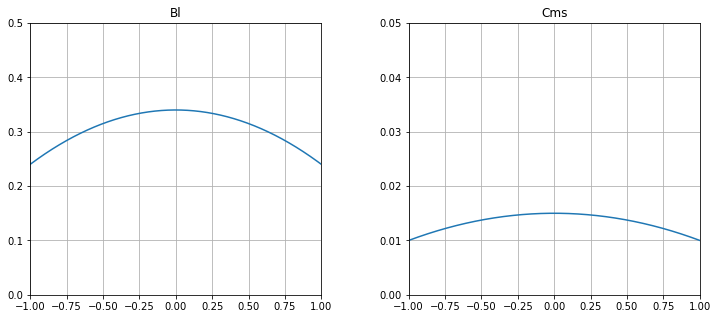

In [58]:
x_test = np.arange(-1, 1, 1e-3)

bl_0 = 0.34
cms_0 = 0.015

y_bl = -0.1 * x_test**2 + bl_0
y_cms = -0.005 * x_test**2 + cms_0

fig, ax = plt.subplots(ncols=2, figsize=(12, 5))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax[0].plot(x_test, y_bl)
ax[1].plot(x_test, y_cms)

ax[0].set_title("Bl")
ax[0].set_xlim(-1, 1)
ax[0].set_ylim(0, 0.5)
ax[0].grid(which="both")

ax[1].set_title("Cms")
ax[1].set_xlim(-1, 1)
ax[1].set_ylim(0, 0.05)
ax[1].grid(which="both")

plt.show()

In [59]:
# input power : 01mW

import codecs

log_file = "./spice_files/demo_11/demo_11_01mw.log"

with codecs.open(log_file, "r", "Shift-JIS", "ignore") as file:
    s = file.readlines()
# print(s)

freq_list = []
thd_dict_01mw = {}

for line in s : 
    new_line = line.replace("\x00", "")
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        thd_dict_01mw[param_name] = []
        # print(param_name)
        

for line in s : 
    new_line = line.replace("\x00", "")
    if ".step" in new_line : 
        step_line = new_line
        step_line_list = step_line.split("=")
        freq_block = step_line_list[1].split("\n")
        freq = float(freq_block[0])
        freq_list.append(freq)
        
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        
    if "Total Harmonic Distortion" in new_line : 
        thd_line = new_line
        thd_line_list = thd_line.split(" ")
        thd_block = thd_line_list[3].split("%")
        thd = float(thd_block[0])
        thd_dict_01mw[param_name].append(thd)


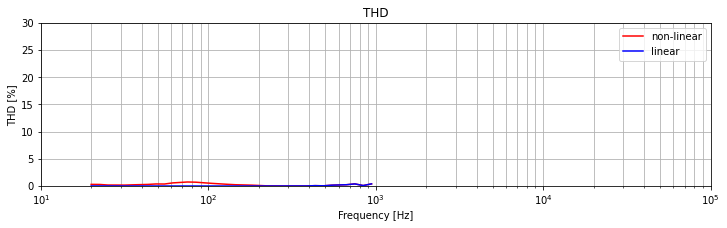

In [60]:
fig, ax = plt.subplots(figsize=(12, 3))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax.semilogx(freq_list, thd_dict_01mw["V(splout_v)"], color="r", label="non-linear")
ax.semilogx(freq_list, thd_dict_01mw["V(splout_lin_v)"], color="b", label="linear")
ax.set_title("THD")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(10, 100000)
ax.set_ylabel("THD [%]")
ax.set_ylim(0, 30)
ax.grid(which="both")
ax.legend()
plt.show()

In [61]:
# input power : 10mW

import codecs

log_file = "./spice_files/demo_11/demo_11_10mw.log"

with codecs.open(log_file, "r", "Shift-JIS", "ignore") as file:
    s = file.readlines()
# print(s)

freq_list = []
thd_dict_10mw = {}

for line in s : 
    new_line = line.replace("\x00", "")
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        thd_dict_10mw[param_name] = []
        # print(param_name)
        

for line in s : 
    new_line = line.replace("\x00", "")
    if ".step" in new_line : 
        step_line = new_line
        step_line_list = step_line.split("=")
        freq_block = step_line_list[1].split("\n")
        freq = float(freq_block[0])
        freq_list.append(freq)
        
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        
    if "Total Harmonic Distortion" in new_line : 
        thd_line = new_line
        thd_line_list = thd_line.split(" ")
        thd_block = thd_line_list[3].split("%")
        thd = float(thd_block[0])
        thd_dict_10mw[param_name].append(thd)


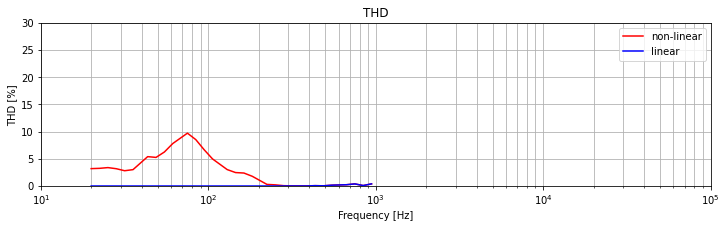

In [62]:
fig, ax = plt.subplots(figsize=(12, 3))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax.semilogx(freq_list, thd_dict_10mw["V(splout_v)"], color="r", label="non-linear")
ax.semilogx(freq_list, thd_dict_10mw["V(splout_lin_v)"], color="b", label="linear")
ax.set_title("THD")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(10, 100000)
ax.set_ylabel("THD [%]")
ax.set_ylim(0, 30)
ax.grid(which="both")
ax.legend()
plt.show()

In [63]:
# input power : 25mW

import codecs

log_file = "./spice_files/demo_11/demo_11_25mw.log"

with codecs.open(log_file, "r", "Shift-JIS", "ignore") as file:
    s = file.readlines()
# print(s)

freq_list = []
thd_dict_25mw = {}

for line in s : 
    new_line = line.replace("\x00", "")
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        thd_dict_25mw[param_name] = []
        # print(param_name)
        

for line in s : 
    new_line = line.replace("\x00", "")
    if ".step" in new_line : 
        step_line = new_line
        step_line_list = step_line.split("=")
        freq_block = step_line_list[1].split("\n")
        freq = float(freq_block[0])
        freq_list.append(freq)
        
    if "Fourier components of " in new_line : 
        name_line = new_line
        param_name = name_line.split(" ")[-1].replace("\n", "")
        
    if "Total Harmonic Distortion" in new_line : 
        thd_line = new_line
        thd_line_list = thd_line.split(" ")
        thd_block = thd_line_list[3].split("%")
        thd = float(thd_block[0])
        thd_dict_25mw[param_name].append(thd)


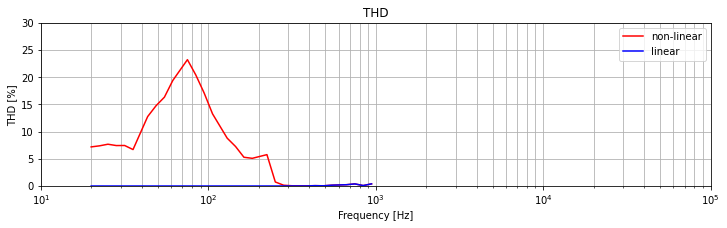

In [64]:
fig, ax = plt.subplots(figsize=(12, 3))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax.semilogx(freq_list, thd_dict_25mw["V(splout_v)"], color="r", label="non-linear")
ax.semilogx(freq_list, thd_dict_25mw["V(splout_lin_v)"], color="b", label="linear")
ax.set_title("THD")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(10, 100000)
ax.set_ylabel("THD [%]")
ax.set_ylim(0, 30)
ax.grid(which="both")
ax.legend()
plt.show()

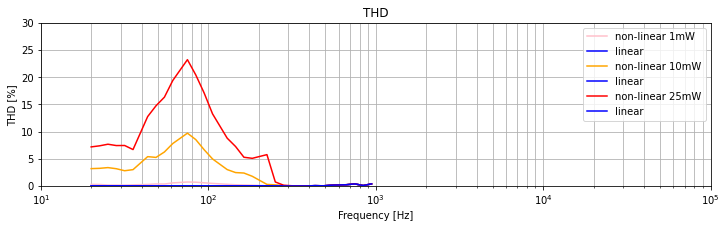

In [65]:
fig, ax = plt.subplots(figsize=(12, 3))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

ax.semilogx(freq_list, thd_dict_01mw["V(splout_v)"], color="pink", label="non-linear 1mW")
ax.semilogx(freq_list, thd_dict_01mw["V(splout_lin_v)"], color="b", label="linear")
ax.semilogx(freq_list, thd_dict_10mw["V(splout_v)"], color="orange", label="non-linear 10mW")
ax.semilogx(freq_list, thd_dict_10mw["V(splout_lin_v)"], color="b", label="linear")
ax.semilogx(freq_list, thd_dict_25mw["V(splout_v)"], color="r", label="non-linear 25mW")
ax.semilogx(freq_list, thd_dict_25mw["V(splout_lin_v)"], color="b", label="linear")
ax.set_title("THD")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(10, 100000)
ax.set_ylabel("THD [%]")
ax.set_ylim(0, 30)
ax.grid(which="both")
ax.legend()
plt.show()

## .cir fileの書き出し

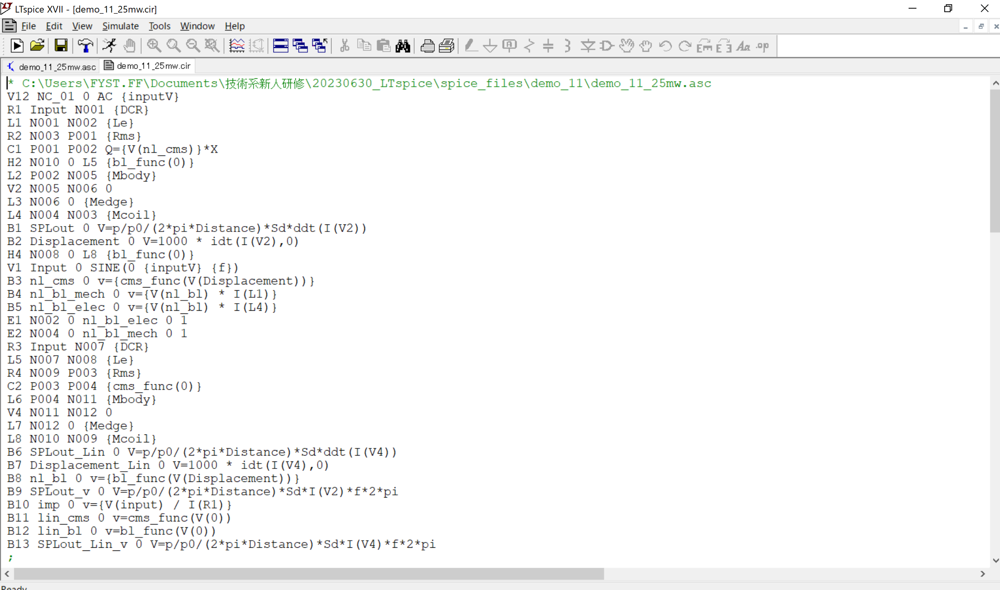

In [66]:
display_png(Image('./pics/cir_file.png'))

## 参考までに

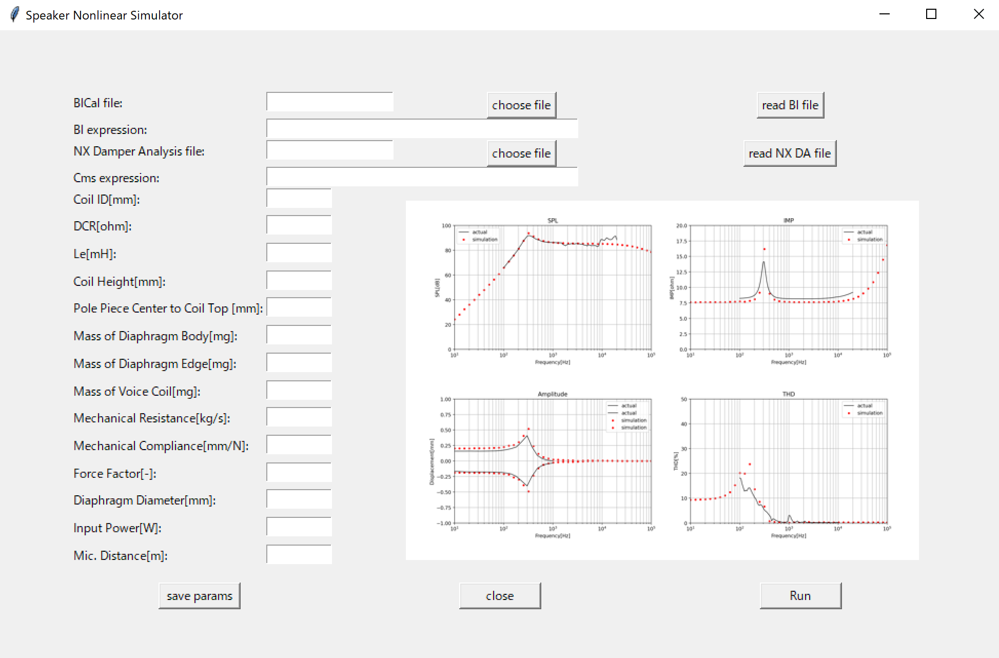

In [67]:
display_png(Image('./pics/fyst_nonlinear_sim.png'))

# 以上、お疲れ様でした。